In [1]:
import numpy as np
import pandas as pd
import glob
import os
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from pathlib import Path

In [2]:
def get_ground_truth(args):
    (collectionName, phoneName), df = args
    
    path = root_dir / f"train/{collectionName}/{phoneName}/ground_truth.csv"
    target_df = pd.read_csv(path)
    output_df = pd.DataFrame()
    # merge derived and target by 'millisSinceGpsEpoch'
    for epoch, epoch_df in df.groupby('millisSinceGpsEpoch'):
        idx = (target_df['millisSinceGpsEpoch'] - epoch).abs().argmin()
        epoch_diff = epoch - target_df.loc[idx, 'millisSinceGpsEpoch']
        epoch_df['epoch_diff'] = epoch_diff
        epoch_df['target_latDeg'] = target_df.loc[idx, 'latDeg']
        epoch_df['target_lngDeg'] = target_df.loc[idx, 'lngDeg']
        output_df = pd.concat([output_df, epoch_df]).reset_index(drop=True)    
    return output_df

In [3]:
# metric
def calc_haversine(lat1, lon1, lat2, lon2):
    """Calculates the great circle distance between two points
    on the earth. Inputs are array-like and specified in decimal degrees.
    """
    RADIUS = 6_367_000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    dist = 2 * RADIUS * np.arcsin(a**0.5)
    return dist

In [4]:
# config
EXP_NAME = str(Path().resolve()).split('/')[-1]

In [5]:
EXP_NAME

'exp005'

In [6]:
# waypointを補正したdataset
root_dir = Path('../../input/')
test_df = pd.read_csv(root_dir / "baseline_locations_test.csv")
sub_df = pd.read_csv(root_dir / 'sample_submission.csv')

In [7]:
## 評価のために

In [8]:
import multiprocessing
train_df = pd.read_csv(root_dir / "baseline_locations_train.csv")

processes = multiprocessing.cpu_count()
with multiprocessing.Pool(processes=processes) as pool:
    gr = train_df.groupby(['collectionName','phoneName'])
    dfs = pool.imap_unordered(get_ground_truth, gr)
    dfs = tqdm(dfs, total=len(gr))
    dfs = list(dfs)
train_df = pd.concat(dfs).sort_values(['collectionName', 'phoneName', 'millisSinceGpsEpoch'])
calc_haversine(train_df['latDeg'],train_df['lngDeg'],
               train_df['target_latDeg'], train_df['target_lngDeg']).mean()

  0%|          | 0/73 [00:00<?, ?it/s]

3.846848374995186

## 線形補間  

In [9]:
def linear_interpolation(input_df):
    dfs = pd.DataFrame()
    for (collectionName, phoneName), df in input_df.groupby(['collectionName','phoneName']):

        df['delta'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg'].shift(1), df['lngDeg'].shift(1))
        df['time_delta'] = df['millisSinceGpsEpoch'] - df['millisSinceGpsEpoch'].shift(1)
        df['delta'].fillna(0, inplace=True)
        df['time_delta'].fillna(0, inplace=True)
        df['speed'] = df['delta'] / (df['time_delta']/1000)  # m/s
        df['speed'].fillna(0, inplace=True)

        # 一度欠損値にする
        df.loc[50<df['speed'], ['latDeg', 'lngDeg']] = np.nan
        df['dummy_datetime'] = pd.to_datetime(df['millisSinceGpsEpoch'])
        df = df.set_index('dummy_datetime')

        # 時間に合わせて線形補間
        df = df.interpolate(method='time').reset_index(drop=True)
        dfs = pd.concat([dfs, df]).reset_index(drop=True)
    return dfs

In [10]:
# 線形補間による修正
train_df = linear_interpolation(train_df)
calc_haversine(train_df['latDeg'],train_df['lngDeg'],
               train_df['target_latDeg'], train_df['target_lngDeg']).mean()

3.6084284244593343

## カルマンフィルタ

In [11]:
import simdkalman

# define kf model
T = 1.0
state_transition = np.array([[1, 0, T, 0, 0.5 * T ** 2, 0], [0, 1, 0, T, 0, 0.5 * T ** 2], [0, 0, 1, 0, T, 0],
                             [0, 0, 0, 1, 0, T], [0, 0, 0, 0, 1, 0], [0, 0, 0, 0, 0, 1]])
process_noise = np.diag([1e-5, 1e-5, 5e-6, 5e-6, 1e-6, 1e-6]) + np.ones((6, 6)) * 1e-9
observation_model = np.array([[1, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0]])
observation_noise = np.diag([5e-5, 5e-5]) + np.ones((2, 2)) * 1e-9

kf = simdkalman.KalmanFilter(
        state_transition = state_transition,
        process_noise = process_noise,
        observation_model = observation_model,
        observation_noise = observation_noise)

In [12]:
def apply_kf_smoothing(df, kf_=kf):
    unique_paths = df[['collectionName', 'phoneName']].drop_duplicates().to_numpy()
    for collection, phone in tqdm(unique_paths):
        cond = np.logical_and(df['collectionName'] == collection, df['phoneName'] == phone)
        data = df[cond][['latDeg', 'lngDeg']].to_numpy()
        data = data.reshape(1, len(data), 2)
        smoothed = kf_.smooth(data)
        df.loc[cond, 'latDeg'] = smoothed.states.mean[0, :, 0]
        df.loc[cond, 'lngDeg'] = smoothed.states.mean[0, :, 1]
    return df

In [13]:
# kalman fileter smoothing
train_df = apply_kf_smoothing(train_df)
calc_haversine(train_df['latDeg'],train_df['lngDeg'],
               train_df['target_latDeg'], train_df['target_lngDeg']).mean()

  0%|          | 0/73 [00:00<?, ?it/s]

3.1564629632183157

In [14]:
# # 同じcollection、epochである端末の予測値を平均する(アンサンブル的な感じ)
# train_df = train_df.merge(train_df.groupby(['collectionName', 'millisSinceGpsEpoch'])[['latDeg', 'lngDeg']].mean(), on=['collectionName', 'millisSinceGpsEpoch'])
# train_df = train_df.drop(['latDeg_x', 'lngDeg_x'], axis=1).rename(columns={'latDeg_y':'latDeg', 'lngDeg_y':'lngDeg'})
# calc_haversine(train_df['latDeg'],train_df['lngDeg'],
#                train_df['target_latDeg'], train_df['target_lngDeg']).mean()

## snap to grid

In [15]:
from scipy.spatial.distance import cdist
import multiprocessing

def add_xy(df):
    df['point'] = [(x, y) for x,y in zip(df['latDeg'], df['lngDeg'])]
    return df

def closest_point(point, points):
    """ Find closest point from a list of points. """
    return points[cdist([point], points).argmin()]

def snap_to_grid(sub, threshold):
    """
    Snap to grid if within a threshold.
    
    latDeg, lngDeg are the predicted points.
    latDeg_, lngDeg_ are the closest grid points.
    _latDeg_, _lngDeg_ are the new predictions after post processing.
    """
    sub['_latDeg_'] = sub['latDeg']
    sub['_lngDeg_'] = sub['lngDeg']
    sub.loc[sub['dist'] < threshold, '_latDeg_'] = sub.loc[sub['dist'] < threshold]['latDeg_']
    sub.loc[sub['dist'] < threshold, '_lngDeg_'] = sub.loc[sub['dist'] < threshold]['lngDeg_']
    return sub.copy()

    
def matching_point(args):
    site, d = args
    gt_site_df = ground_truth_df.loc[(ground_truth_df['site'] == site)].reset_index(drop=True)
    if len(gt_site_df) == 0:
        print(f'Skipping {site}')
        return d
    else:
        d['matched_point'] = [closest_point(x, list(gt_site_df['point'])) for x in d['point']]
        d['latDeg_'] = d['matched_point'].apply(lambda x: x[0])
        d['lngDeg_'] = d['matched_point'].apply(lambda x: x[1])
        return d
    
    
def apply_snap_to_grid(df, ground_truth_df):
    df['site'] = df['collectionName'].str[11:].str.split('_', expand=True)[0]
    ground_truth_df['site'] = ground_truth_df['collectionName'].str[11:].str.split('_', expand=True)[0]
    df = add_xy(df)
    ground_truth_df = add_xy(ground_truth_df)
    ds = []
    processes = multiprocessing.cpu_count()
    with multiprocessing.Pool(processes=processes) as pool:
        gr = df.groupby(['site'])
        d = pool.imap_unordered(matching_point, gr)
        d = list(tqdm(d, total=len(gr)))
        ds.append(d)

    # 上書き
    df = pd.concat(ds[0]).sort_index()
    
    # Calculate the distances
    df['dist'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg_'], df['lngDeg_'])
    df = snap_to_grid(df, threshold=10)
    df = df.drop(['latDeg', 'lngDeg', 'latDeg_', 'lngDeg'], axis=1).rename(columns={'_latDeg_':'latDeg','_lngDeg_':'lngDeg'})
    return df

In [34]:
ground_truth_df = pd.read_csv('../../input/all_ground_truth.csv')
train_df = apply_snap_to_grid(train_df, ground_truth_df)
calc_haversine(train_df['latDeg'],train_df['lngDeg'],
               train_df['target_latDeg'], train_df['target_lngDeg']).mean()

  0%|          | 0/10 [00:00<?, ?it/s]

2.9863115604886303

## test

In [35]:
import pickle
def to_pickle(filename, obj):
    with open(filename, mode='wb') as f:
        pickle.dump(obj, f)
        
def from_pickle(filename):
    with open(filename, mode='rb') as f:
        obj = pickle.load(f)
    return obj

In [36]:
test_df = linear_interpolation(test_df)

In [37]:
test_df = apply_kf_smoothing(test_df)

  0%|          | 0/48 [00:00<?, ?it/s]

In [38]:
test_df = apply_snap_to_grid(test_df, ground_truth_df)

  0%|          | 0/8 [00:00<?, ?it/s]

Skipping US-PAO-1
Skipping US-SJC-3


In [39]:
sub_df = sub_df.assign(
    latDeg = test_df['latDeg'],
    lngDeg = test_df['lngDeg']
)
sub_df.to_csv('submission.csv', index=False)

In [40]:
sub_df

,phone,millisSinceGpsEpoch,latDeg,lngDeg
0,2020-05-15-US-MTV-1_Pixel4,1273608785432,37.416611,-122.081959
1,2020-05-15-US-MTV-1_Pixel4,1273608786432,37.416623,-122.082009
2,2020-05-15-US-MTV-1_Pixel4,1273608787432,37.416627,-122.082040
3,2020-05-15-US-MTV-1_Pixel4,1273608788432,37.416623,-122.082060
4,2020-05-15-US-MTV-1_Pixel4,1273608789432,37.416621,-122.082070
...,...,...,...,...
91481,2021-04-29-US-SJC-3_SamsungS20Ultra,1303763185000,37.334542,-121.899389
91482,2021-04-29-US-SJC-3_SamsungS20Ultra,1303763186000,37.334544,-121.899381
91483,2021-04-29-US-SJC-3_SamsungS20Ultra,1303763187000,37.334546,-121.899373
91484,2021-04-29-US-SJC-3_SamsungS20Ultra,1303763188000,37.334550,-121.899365


In [42]:
!pip install plotly

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 13.2 MB 931 kB/s eta 0:00:01
  Created wheel for retrying: filename=retrying-1.3.3-py3-none-any.whl size=11430 sha256=f3fc8b5193cffb46816719ddbfd72c710766c1b950dddeda2fbeba848def2c78
  Stored in directory: /home/user/.cache/pip/wheels/c4/a7/48/0a434133f6d56e878ca511c0e6c38326907c0792f67b476e56
Successfully built retrying
You should consider upgrading via the '/usr/bin/python3 -m pip install --upgrade pip' command.


In [46]:
import plotly.express as px
def visualize_trafic(df, center, zoom=9):
    fig = px.scatter_mapbox(df,
                            
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                            
                            #Here, plotly detects color of series
                            color="phoneName",
                            labels="phoneName",
                            
                            zoom=zoom,
                            center=center,
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="GPS trafic")
    fig.show()

In [48]:
fig = px.scatter_mapbox(test_df,
                            
                        # Here, plotly gets, (x,y) coordinates
                        lat="latDeg",
                        lon="lngDeg",
                        text='phoneName',
                            
                        #Here, plotly detects color of series
                        color="collectionName",
                        labels="collectionName",
                            
                        zoom=9,
                        center={"lat":37.423576, "lon":-122.094132},
                        height=600,
                        width=800)
fig.update_layout(mapbox_style='stamen-terrain')
fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
fig.update_layout(title_text="GPS trafic")
fig.show()

In [28]:
_sub = pd.read_csv(root_dir/'kf_sample_sub.csv')

In [35]:
_x = _sub.loc[_sub['phone']=='2020-05-15-US-MTV-1_Pixel4', 'latDeg']
_y = _sub.loc[_sub['phone']=='2020-05-15-US-MTV-1_Pixel4', 'lngDeg']

In [36]:
x = sub_df.loc[sub_df['phone']=='2020-05-15-US-MTV-1_Pixel4', 'latDeg']
y = sub_df.loc[sub_df['phone']=='2020-05-15-US-MTV-1_Pixel4', 'lngDeg']

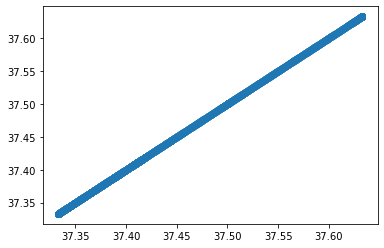

In [37]:
plt.scatter(x, _x)

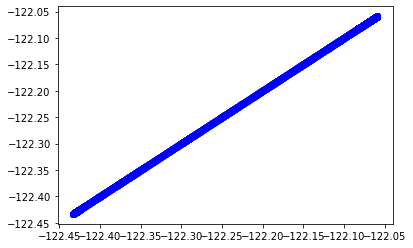

In [38]:
plt.scatter(y, _y, color='blue')

<AxesSubplot:>

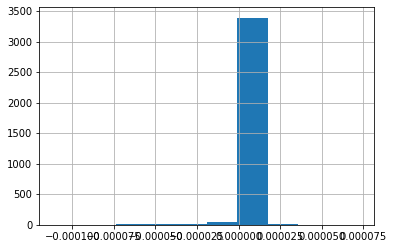

In [40]:
(x - _x).hist()

<AxesSubplot:>

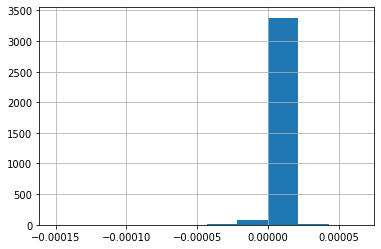

In [41]:
(y - _y).hist()